In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
transaction = pd.read_excel('QVI_transaction_data.xlsx')

In [3]:
transaction

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


In [4]:
purchase = pd.read_csv('QVI_purchase_behaviour.csv')

In [5]:
purchase

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream
...,...,...,...
72632,2370651,MIDAGE SINGLES/COUPLES,Mainstream
72633,2370701,YOUNG FAMILIES,Mainstream
72634,2370751,YOUNG FAMILIES,Premium
72635,2370961,OLDER FAMILIES,Budget


In [6]:
transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DATE            264836 non-null  int64  
 1   STORE_NBR       264836 non-null  int64  
 2   LYLTY_CARD_NBR  264836 non-null  int64  
 3   TXN_ID          264836 non-null  int64  
 4   PROD_NBR        264836 non-null  int64  
 5   PROD_NAME       264836 non-null  object 
 6   PROD_QTY        264836 non-null  int64  
 7   TOT_SALES       264836 non-null  float64
dtypes: float64(1), int64(6), object(1)
memory usage: 16.2+ MB


### There are no missing values in the data

A quick search online tells us that CSV and Excel integer dates begin on 30
Dec 1899

In [7]:
from datetime import date, timedelta

In [8]:
start = date(1899,12,30)

In [9]:
check = start + timedelta(days = 43390)

In [10]:
check

datetime.date(2018, 10, 17)

In [11]:
transaction['DATES'] = transaction['DATE'].apply(lambda x: start + timedelta(days = x))

In [12]:
transaction

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,DATES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,2018-10-17
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,2019-05-14
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,2019-05-20
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,2018-08-17
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,2018-08-18
...,...,...,...,...,...,...,...,...,...
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,2019-03-09
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,2018-08-13
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,2018-11-06
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,2018-12-27


In [13]:
transaction.set_index('DATES',inplace=True)

In [14]:
transaction.drop('DATE',axis=1,inplace=True)

In [15]:
transaction.describe()

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,264836.00000,2.648360e+05,2.648360e+05,264836.000000,264836.000000,264836.000000
mean,135.08011,1.355495e+05,1.351583e+05,56.583157,1.907309,7.304200
std,76.78418,8.057998e+04,7.813303e+04,32.826638,0.643654,3.083226
min,1.00000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.500000
25%,70.00000,7.002100e+04,6.760150e+04,28.000000,2.000000,5.400000
50%,130.00000,1.303575e+05,1.351375e+05,56.000000,2.000000,7.400000
75%,203.00000,2.030942e+05,2.027012e+05,85.000000,2.000000,9.200000
max,272.00000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


### We can see that there is one PROD_QTY and TOT_SALES that seems to be outlier i.e 200 and 650

In [16]:
transaction['PROD_NAME'].value_counts()

Kettle Mozzarella   Basil & Pesto 175g      3304
Kettle Tortilla ChpsHny&Jlpno Chili 150g    3296
Cobs Popd Swt/Chlli &Sr/Cream Chips 110g    3269
Tyrrells Crisps     Ched & Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g              3265
                                            ... 
RRD Pc Sea Salt     165g                    1431
Woolworths Medium   Salsa 300g              1430
NCC Sour Cream &    Garden Chives 175g      1419
French Fries Potato Chips 175g              1418
WW Crinkle Cut      Original 175g           1410
Name: PROD_NAME, Length: 114, dtype: int64

In [17]:
import re

In [18]:
pattern = r"\d|[^\w\s]"

In [19]:
# Split each string into words and remove digits and special characters
def clean_words(text):
    return [re.sub(pattern, "", word).lower() for word in text.split()]

In [20]:
clean_words = transaction['PROD_NAME'].apply(clean_words)

In [21]:
clean_words

DATES
2018-10-17               [natural, chip, compny, seasaltg]
2019-05-14                         [ccs, nacho, cheese, g]
2019-05-20       [smiths, crinkle, cut, chips, chicken, g]
2018-08-17          [smiths, chip, thinly, screamonion, g]
2018-08-18      [kettle, tortilla, chpshnyjlpno, chili, g]
                                  ...                     
2019-03-09    [kettle, sweet, chilli, and, sour, cream, g]
2018-08-13                 [tostitos, splash, of, lime, g]
2018-11-06                          [doritos, mexicana, g]
2018-12-27     [doritos, corn, chip, mexican, jalapeno, g]
2018-09-22                 [tostitos, splash, of, lime, g]
Name: PROD_NAME, Length: 264836, dtype: object

In [22]:
# Create a dictionary to count word frequencies
word_counts = {}
for words in clean_words:
    for word in words:
        if word in word_counts:
            word_counts[word] += 1
        else:
            word_counts[word] = 1

In [23]:
# Sort words by frequency in descending order
sorted_words = sorted(word_counts.items(), key=lambda item: item[1], reverse=True)

In [24]:
# Print the distinct words and their frequencies
print("Distinct words and their frequencies:")
for word, count in sorted_words:
    print(f"{word}: {count}")

Distinct words and their frequencies:
g: 251231
chips: 49770
kettle: 41288
: 35565
smiths: 28860
salt: 27976
cheese: 27890
pringles: 25102
doritos: 24962
crinkle: 23960
corn: 22063
original: 21560
cut: 20754
chip: 18645
salsa: 18094
chicken: 15407
sea: 14145
thins: 14075
chilli: 13895
sour: 13882
crisps: 12607
vinegar: 12402
rrd: 11894
infuzions: 11057
supreme: 10963
ww: 10320
cobs: 9693
popd: 9693
tortilla: 9580
tostitos: 9471
twisties: 9454
sensations: 9429
old: 9324
el: 9324
paso: 9324
dip: 9324
sweet: 7883
lime: 7852
chives: 7846
tomato: 7669
cream: 7618
thinly: 7507
tyrrells: 6442
and: 6373
bbq: 6351
tangy: 6332
grain: 6272
waves: 6272
lightly: 6248
salted: 6248
soy: 6121
natural: 6050
mild: 6048
red: 5885
rock: 5885
deli: 5885
thai: 4737
burger: 4733
swt: 4718
honey: 4661
nacho: 4658
potato: 4647
cheezels: 4603
ccs: 4551
woolworths: 4437
mozzarella: 3304
basil: 3304
pesto: 3304
chpshnyjlpno: 3296
chili: 3296
swtchlli: 3269
srcream: 3269
ched: 3268
pot: 3257
splash: 3252
of: 3252


## We don't want salsa as this is only for chips

In [36]:
transaction_new = transaction[~transaction['PROD_NAME'].str.lower().str.contains('salsa')]

In [37]:
transaction_new

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
DATES,,,,,,,
2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...
2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8


In [38]:
transaction_new.describe()

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,246742.000000,2.467420e+05,2.467420e+05,246742.000000,246742.000000,246742.000000
mean,135.051098,1.355310e+05,1.351311e+05,56.351789,1.908062,7.321322
std,76.787096,8.071528e+04,7.814772e+04,33.695428,0.659831,3.077828
min,1.000000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.700000
25%,70.000000,7.001500e+04,6.756925e+04,26.000000,2.000000,5.800000
50%,130.000000,1.303670e+05,1.351830e+05,53.000000,2.000000,7.400000
75%,203.000000,2.030840e+05,2.026538e+05,87.000000,2.000000,8.800000
max,272.000000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


## We can still see the outliers in the dataset even after dropping ~18k salsa products

In [43]:
transaction_new[transaction_new['PROD_QTY'] == 200]

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
DATES,,,,,,,
2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme 380g,200,650.0
2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme 380g,200,650.0


### Both the higher quantity products purchased and the sales corresponding to it, seems to be done by the same customer. We can assume that this customer is purchasing for commercial use and not personal. Therefore we can remove these rows

In [44]:
transaction_new = transaction_new[transaction_new['PROD_QTY'] != 200]

In [45]:
transaction_new

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
DATES,,,,,,,
2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...
2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8


In [47]:
transaction_new.index.value_counts()

2018-12-24    865
2018-12-23    853
2018-12-22    840
2018-12-19    839
2018-12-20    808
             ... 
2019-06-24    612
2018-10-18    611
2018-11-25    610
2018-09-22    609
2019-06-13    607
Name: DATES, Length: 364, dtype: int64

### There is only 364 dates and we are missing one day

In [48]:
# Define the start and end date
start_date = pd.to_datetime('2018-07-01')
end_date = pd.to_datetime('2019-06-30')

In [108]:
# Create a range of dates
date_range = pd.date_range(start_date, end_date).astype(str)

In [115]:
date_range = date_range.to_list()

In [133]:
#date_range

In [55]:
transaction_new.index = pd.to_datetime(transaction_new.index)

In [78]:
transaction_new = transaction_new.reset_index()

In [79]:
transaction_new

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


In [89]:
df = pd.DataFrame(columns=['DATE','TRANSACTIONS'])

In [129]:
for date in date_range:
    num_t = len(transaction_new[transaction_new['DATES'] == date])
    num = pd.DataFrame({'DATE':date,'TRANSACTIONS':num_t},index=[0])
    df = pd.concat([df,num])

In [131]:
df.reset_index(drop=True,inplace=True)

In [132]:
df

,DATE,TRANSACTIONS
0,2018-07-01,663
1,2018-07-02,650
2,2018-07-03,674
3,2018-07-04,669
4,2018-07-05,660
...,...,...
360,2019-06-26,657
361,2019-06-27,669
362,2019-06-28,673
363,2019-06-29,703


In [182]:
fig = px.line(df,x='DATE',y='TRANSACTIONS')

fig.update_layout(
    title="Transactions on Day",
    xaxis_title="Date",
    yaxis_title="Number of Transactions",
)

![Image description](newplot.png)

### We can see on the plot that on Dec 25th we have 0 transcations that was probably because all stores were closed on Christmas. So we don't need to worry about the missing date. We can also see from the plot that december month had the highest transactions

In [135]:
transaction_new

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


In [166]:
pattern = r"(\d+g)"

# Extract the weight using pandas apply
def extract_weight(text):
    match = re.search(pattern, str.lower(text))
    if match:
        return match.group(1)
    else:
        return None

In [167]:
transaction_new['PACKSIZE'] = transaction_new['PROD_NAME'].apply(extract_weight)

In [168]:
transaction_new

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKSIZE
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175g
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175g
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150g
...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g


In [181]:
transaction_new[transaction_new['PACKSIZE'].isna()]

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKSIZE


In [180]:
fig = px.histogram(transaction_new,x=transaction_new['PACKSIZE'])

fig.update_layout(
    title="Transactions on Packsize",
    xaxis_title="Pack Size",
    yaxis_title="Number of Transactions",
)

![Image description](newplotcopy.png)

### From the above graph we can see that Packsize of 175g has the highest sales followed by 150g and 134g

In [185]:
transaction_new['PROD_BRAND'] = transaction_new['PROD_NAME'].apply(lambda name: name.split(" ")[0])

In [186]:
transaction_new

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKSIZE,PROD_BRAND
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175g,Natural
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g,CCs
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g,Smiths
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175g,Smiths
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150g,Kettle
...,...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g,Kettle
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g,Tostitos
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g,Doritos
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g,Doritos


In [203]:
fig = px.histogram(transaction_new,x='PROD_BRAND')

fig.update_layout(
    title="Transactions on Product Brand",
    xaxis_title="Product Brand",
    yaxis_title="Number of Transactions",
)

In [337]:
![Image description](newplotcopy.png)

zsh:1: bad pattern: [Image


### Kettle had the highest sales followed by Smiths and Pringles

In [248]:
pack_brand = transaction_new[(transaction_new['PACKSIZE'] == '175g')]['PROD_BRAND'].value_counts()

In [249]:
pack_brand = pd.DataFrame(pack_brand)

In [250]:
pack_brand

,PROD_BRAND
Kettle,19022
Thins,14075
Tostitos,9471
Smiths,7507
Natural,6050
CCs,4551
WW,2877
NCC,1419
French,1418


In [251]:
fig = px.pie(pack_brand,names=pack_brand.index,values='PROD_BRAND')

fig.update_layout(
    title="Number of Transactions of Pack size 175g by Product Brand",
)

### Out of ~66k sales for packsize 175g, Kettle sold 28% of the 175g's, followed by Thins and Tostitos selling 21% and 14% of the 175g's respectively

In [245]:
pack_brand = transaction_new[(transaction_new['PACKSIZE'] == '150g')]['PROD_BRAND'].value_counts()

In [246]:
pack_brand

Kettle     19009
Doritos     6376
RRD         4487
Red         4427
Smith       2963
Smiths      2941
Name: PROD_BRAND, dtype: int64

In [247]:
fig = px.pie(pack_brand,names=pack_brand.index,values='PROD_BRAND')

fig.update_layout(
    title="Number of Transactions of Pack size 150g by Product Brand",
)

### 50% of sales of 150g's was by Kettle

In [256]:
pack_brand = transaction_new[(transaction_new['PROD_BRAND'] == 'Kettle')]['PACKSIZE'].value_counts()

In [257]:
pack_brand

175g    19022
150g    19009
135g     3257
Name: PACKSIZE, dtype: int64

In [259]:
fig = px.pie(pack_brand,values='PACKSIZE',names=pack_brand.index)

fig.update_layout(
    title="Sales of Pack size by Kettle",
)

### Kettle with the highest sales overall had 46% sales from 175g's, 46% from 150g's and the rest from 135g's

In [260]:
pack_brand = transaction_new[(transaction_new['PROD_BRAND'] == 'Smiths')]['PACKSIZE'].value_counts()

In [261]:
pack_brand

175g    7507
170g    7370
330g    6339
380g    3233
150g    2941
Name: PACKSIZE, dtype: int64

In [262]:
fig = px.pie(pack_brand,values='PACKSIZE',names=pack_brand.index)

fig.update_layout(
    title="Sales of Pack size by Smiths",
)

In [263]:
purchase

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream
...,...,...,...
72632,2370651,MIDAGE SINGLES/COUPLES,Mainstream
72633,2370701,YOUNG FAMILIES,Mainstream
72634,2370751,YOUNG FAMILIES,Premium
72635,2370961,OLDER FAMILIES,Budget


In [266]:
purchase.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [264]:
data = transaction_new.merge(purchase,how='left')

In [265]:
data

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKSIZE,PROD_BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175g,Natural,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g,Smiths,MIDAGE SINGLES/COUPLES,Budget
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175g,Smiths,MIDAGE SINGLES/COUPLES,Budget
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150g,Kettle,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g,Kettle,YOUNG SINGLES/COUPLES,Premium
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g,Tostitos,YOUNG SINGLES/COUPLES,Premium
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g,Doritos,YOUNG SINGLES/COUPLES,Premium
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g,Doritos,YOUNG SINGLES/COUPLES,Premium


In [273]:
data.dropna()

,DATES,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKSIZE,PROD_BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175g,Natural,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g,Smiths,MIDAGE SINGLES/COUPLES,Budget
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175g,Smiths,MIDAGE SINGLES/COUPLES,Budget
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150g,Kettle,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g,Kettle,YOUNG SINGLES/COUPLES,Premium
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g,Tostitos,YOUNG SINGLES/COUPLES,Premium
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g,Doritos,YOUNG SINGLES/COUPLES,Premium
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g,Doritos,YOUNG SINGLES/COUPLES,Premium


In [274]:
data.to_csv('after task-1 (transaction+purchase).csv')

In [297]:
total_sales = data.groupby(['LIFESTAGE','PREMIUM_CUSTOMER'])['TOT_SALES'].sum()

In [298]:
total_sales

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget               33345.70
                        Mainstream           84734.25
                        Premium              54443.85
NEW FAMILIES            Budget               20607.45
                        Mainstream           15979.70
                        Premium              10760.80
OLDER FAMILIES          Budget              156863.75
                        Mainstream           96413.55
                        Premium              75242.60
OLDER SINGLES/COUPLES   Budget              127833.60
                        Mainstream          124648.50
                        Premium             123537.55
RETIREES                Budget              105916.30
                        Mainstream          145168.95
                        Premium              91296.65
YOUNG FAMILIES          Budget              129717.95
                        Mainstream           86338.25
                        Premium          

<Figure size 3600x4500 with 0 Axes>

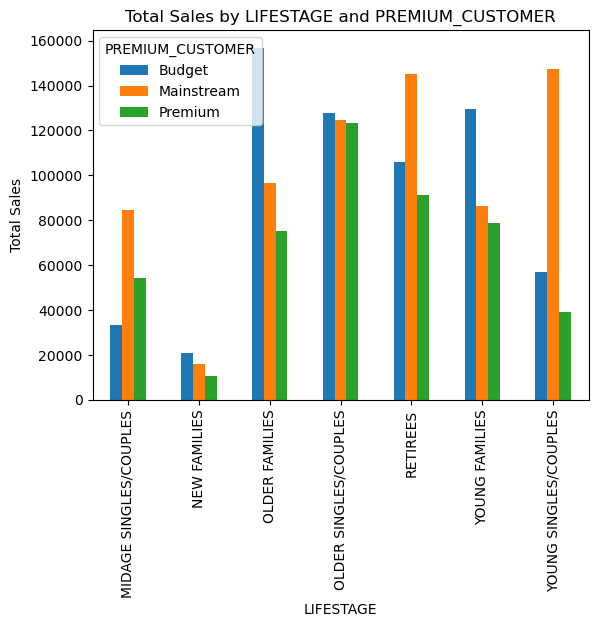

In [299]:
plt.figure(figsize=(12,15),dpi=300)
total_sales_unstacked = total_sales.unstack()
total_sales_unstacked.plot(kind="bar", stacked=False)
plt.xlabel("LIFESTAGE")
plt.ylabel("Total Sales")
plt.title("Total Sales by LIFESTAGE and PREMIUM_CUSTOMER")
plt.legend(title="PREMIUM_CUSTOMER")

In [282]:
total_sales_unstacked

PREMIUM_CUSTOMER,Budget,Mainstream,Premium
LIFESTAGE,,,
MIDAGE SINGLES/COUPLES,33345.70,84734.25,54443.85
NEW FAMILIES,20607.45,15979.70,10760.80
OLDER FAMILIES,156863.75,96413.55,75242.60
OLDER SINGLES/COUPLES,127833.60,124648.50,123537.55
RETIREES,105916.30,145168.95,91296.65
YOUNG FAMILIES,129717.95,86338.25,78571.70
YOUNG SINGLES/COUPLES,57122.10,147582.20,39052.30


In [305]:
total_count = data.groupby(['LIFESTAGE','PREMIUM_CUSTOMER'])['TOT_SALES'].count()

In [306]:
total_count

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget               4691
                        Mainstream          11095
                        Premium              7612
NEW FAMILIES            Budget               2824
                        Mainstream           2185
                        Premium              1488
OLDER FAMILIES          Budget              21514
                        Mainstream          13241
                        Premium             10403
OLDER SINGLES/COUPLES   Budget              17172
                        Mainstream          17061
                        Premium             16560
RETIREES                Budget              14225
                        Mainstream          19970
                        Premium             12236
YOUNG FAMILIES          Budget              17763
                        Mainstream          11947
                        Premium             10784
YOUNG SINGLES/COUPLES   Budget               8573
         

<Figure size 3600x4500 with 0 Axes>

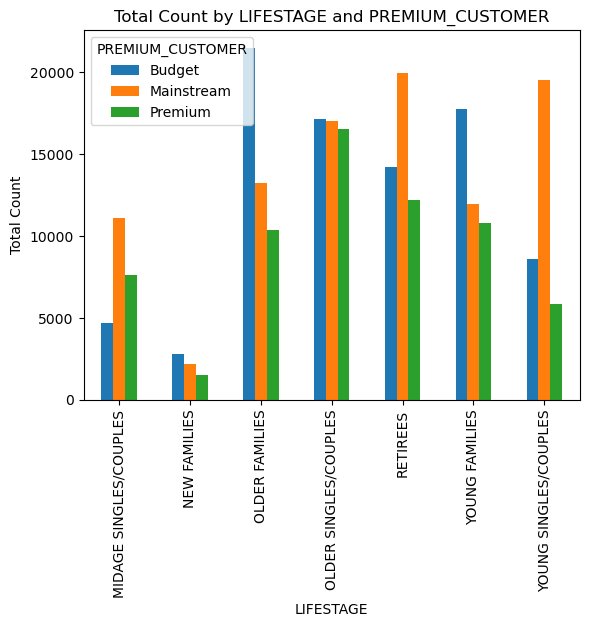

In [318]:
plt.figure(figsize=(12,15),dpi=300)
total_count_unstacked = total_count.unstack()
total_count_unstacked.plot(kind="bar", stacked=False)
plt.xlabel("LIFESTAGE")
plt.ylabel("Total Count")
plt.title("Total Count by LIFESTAGE and PREMIUM_CUSTOMER")
plt.legend(title="PREMIUM_CUSTOMER")

In [308]:
total_units_avg = data.groupby(['LIFESTAGE','PREMIUM_CUSTOMER'])['PROD_QTY'].mean()

In [309]:
total_units_avg

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget              1.893626
                        Mainstream          1.911942
                        Premium             1.891750
NEW FAMILIES            Budget              1.855878
                        Mainstream          1.858124
                        Premium             1.860887
OLDER FAMILIES          Budget              1.945384
                        Mainstream          1.948795
                        Premium             1.945496
OLDER SINGLES/COUPLES   Budget              1.914920
                        Mainstream          1.911201
                        Premium             1.913949
RETIREES                Budget              1.893286
                        Mainstream          1.886680
                        Premium             1.901438
YOUNG FAMILIES          Budget              1.941226
                        Mainstream          1.941408
                        Premium             1.938149
YOUNG

<Figure size 3600x4500 with 0 Axes>

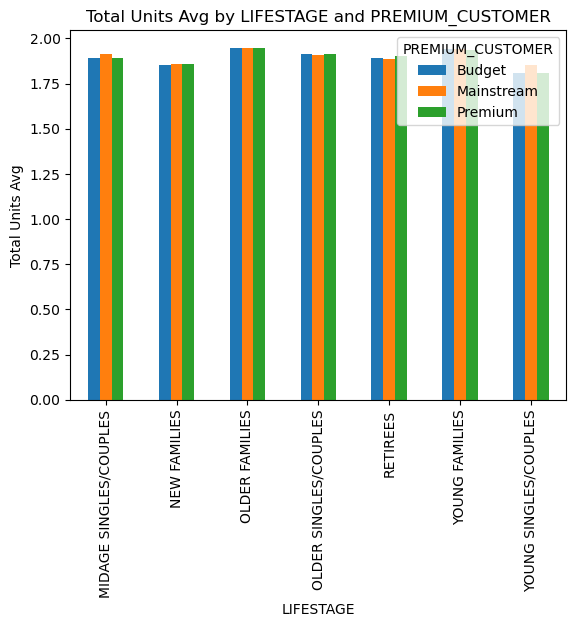

In [319]:
plt.figure(figsize=(12,15),dpi=300)
total_units_avg_unstacked = total_units_avg.unstack()
total_units_avg_unstacked.plot(kind="bar", stacked=False)
plt.xlabel("LIFESTAGE")
plt.ylabel("Total Units Avg")
plt.title("Total Units Avg by LIFESTAGE and PREMIUM_CUSTOMER")
plt.legend(title="PREMIUM_CUSTOMER")

In [311]:
grouped_data = data.groupby(['LIFESTAGE','PREMIUM_CUSTOMER'])

In [314]:
sales = grouped_data['TOT_SALES'].sum()
qty = grouped_data['PROD_QTY'].sum()

In [315]:
avg_price = sales/qty

LIFESTAGE               PREMIUM_CUSTOMER
MIDAGE SINGLES/COUPLES  Budget              3.753878
                        Mainstream          3.994449
                        Premium             3.780823
NEW FAMILIES            Budget              3.931969
                        Mainstream          3.935887
                        Premium             3.886168
OLDER FAMILIES          Budget              3.747969
                        Mainstream          3.736380
                        Premium             3.717703
OLDER SINGLES/COUPLES   Budget              3.887529
                        Mainstream          3.822753
                        Premium             3.897698
RETIREES                Budget              3.932731
                        Mainstream          3.852986
                        Premium             3.924037
YOUNG FAMILIES          Budget              3.761903
                        Mainstream          3.722439
                        Premium             3.759232
YOUNG

<Figure size 3600x4500 with 0 Axes>

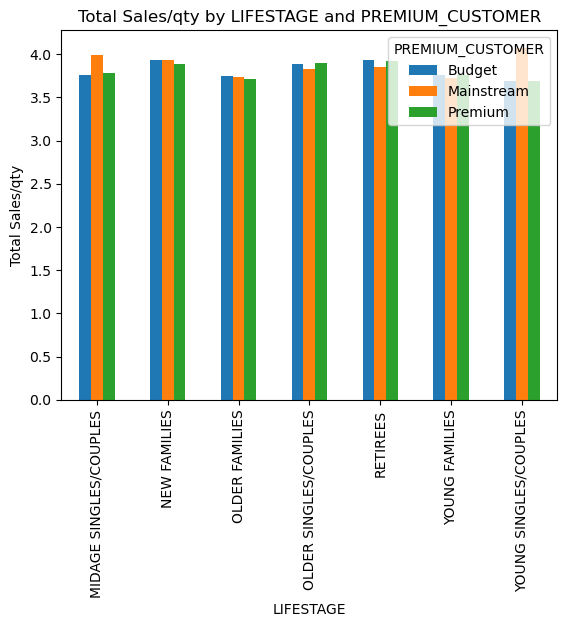

In [320]:
plt.figure(figsize=(12,15),dpi=300)
avg_price_unstacked = avg_price.unstack()
avg_price_unstacked.plot(kind="bar", stacked=False)
plt.xlabel("LIFESTAGE")
plt.ylabel("Total Sales/qty")
plt.title("Total Sales/qty by LIFESTAGE and PREMIUM_CUSTOMER")
plt.legend(title="PREMIUM_CUSTOMER")

In [321]:
brand = grouped_data['PROD_BRAND'].value_counts()

In [323]:
brand[('YOUNG SINGLES/COUPLES','Mainstream')]

PROD_BRAND
Kettle        3844
Pringles      2315
Doritos       2076
Smiths        1790
Thins         1166
Infuzions      962
Twisties       900
Tostitos       890
Cobs           864
RRD            639
Tyrrells       619
Grain          576
WW             423
Cheezels       346
Natural        321
Dorito         303
Infzns         288
Red            236
CCs            222
Cheetos        166
Smith          131
French          78
NCC             73
Snbts           71
GrnWves         70
Burger          62
Sunbites        57
Woolworths      56
Name: PROD_BRAND, dtype: int64

In [324]:
brand[('RETIREES','Mainstream')]

PROD_BRAND
Kettle        3386
Smiths        2122
Pringles      2103
Doritos       1838
Thins         1199
Infuzions      909
RRD            863
Twisties       802
WW             797
Cobs           776
Tostitos       739
Grain          540
Tyrrells       514
Natural        479
Cheezels       382
Red            360
CCs            355
Infzns         273
Dorito         251
Smith          245
Cheetos        236
Snbts          131
GrnWves        127
Burger         122
Sunbites       112
NCC            108
Woolworths     105
French          96
Name: PROD_BRAND, dtype: int64

In [328]:
brand[('OLDER FAMILIES','Budget')]

PROD_BRAND
Kettle        3320
Smiths        2640
Pringles      1996
Doritos       1784
RRD           1218
Thins         1171
WW            1057
Infuzions      908
Twisties       810
Cobs           760
Tostitos       705
Natural        576
Grain          505
Red            490
Tyrrells       489
CCs            451
Cheezels       427
Smith          308
Cheetos        281
Infzns         277
Dorito         248
GrnWves        166
NCC            165
Snbts          162
Burger         159
Woolworths     156
Sunbites       143
French         142
Name: PROD_BRAND, dtype: int64

In [325]:
packsize = grouped_data['PACKSIZE'].value_counts()

In [326]:
packsize[('YOUNG SINGLES/COUPLES','Mainstream')]

PACKSIZE
175g    4997
150g    3080
134g    2315
110g    2051
170g    1575
330g    1195
165g    1102
380g     626
270g     620
210g     576
135g     290
250g     280
200g     179
190g     148
160g     128
90g      128
180g      70
70g       63
220g      62
125g      59
Name: PACKSIZE, dtype: int64

In [327]:
packsize[('RETIREES','Mainstream')]

PACKSIZE
175g    5295
150g    3290
134g    2103
110g    1829
170g    1636
165g    1182
330g    1010
210g     540
270g     514
380g     497
200g     342
250g     288
135g     263
90g      243
160g     221
190g     218
70g      129
180g     127
220g     122
125g     121
Name: PACKSIZE, dtype: int64

In [329]:
packsize['OLDER FAMILIES','Budget']

PACKSIZE
175g    5808
150g    3588
134g    1996
110g    1803
170g    1786
165g    1358
330g    1092
270g     532
380g     510
210g     505
200g     448
190g     312
160g     306
90g      305
250g     278
135g     268
180g     166
220g     159
125g     152
70g      142
Name: PACKSIZE, dtype: int64

# Insights

## Purchase Data

#### Top 3 Transactions by Pack Size 
##### 1. 175g
##### 2. 150g
##### 3. 134g

#### Top 3 Transactions by Product Brand
##### 1. Kettle 
##### 2. Smiths
##### 3. Pringles

#### Kettle sold the most 175g and 150g Packs

## Combined Data(Purchase and Customer)

#### Top 3 Customer with high sales
##### 1. Budget - Older Families
##### 2. Mainstream - Young singles/Couples
##### 3. Mainstream - Retirees

#### Top 4 Brands Purchased by the above customers
##### 1. Kettle
##### 2. Pringles
##### 3. Doritos
##### 4. Smiths

#### Top 3 Packsizes Purchased by the above customers
##### 1. 175g 
##### 2. 150g
##### 3. 134g

### Out of the top 3 Customers with high sales, Mainstream - Young singles/couples bought the most number of Kettle brand chips and Budget - Older Families bought the most 175g Packsixe chips